#Data-Driven Asttronomy

The following problems appeared as assigments in the coursera course **Data-Driven Astroomy**. The description of the problems are take mostly from the course assignments and from https://groklearning.com/learn/data-driven-astro/.

One of the most widely used formats for astronomical images is the **Flexible Image Transport System**. In a **FITS** file, the image is stored in a numerical array. The **FITS files** shown below are some of the publicly available ones dowloaded from the following sites:
* https://www.spacetelescope.org/projects/fits_liberator/datasets_archives/ 
* https://fits.gsfc.nasa.gov/fits_samples.html 
* ftp://legacy.gsfc.nasa.gov/fits_info/sample_files/images 
* http://chandra.harvard.edu/photo/openFITS/casa.html 
* http://www.sergepetiot.com/ 
* http://deep.ucolick.org/archive.html.

In [6]:
#ipython nbconvert pcaiso.ipynb
%matplotlib inline

from IPython.display import HTML

HTML('''<script>
code_show=true; 
function code_toggle() {
 if (code_show){
 $('div.input').hide();
 } else {
 $('div.input').show();
 }
 code_show = !code_show
} 
$( document ).ready(code_toggle);
</script>
<form action="javascript:code_toggle()"><input type="submit" value="Click here to toggle on/off the raw code."></form>''')

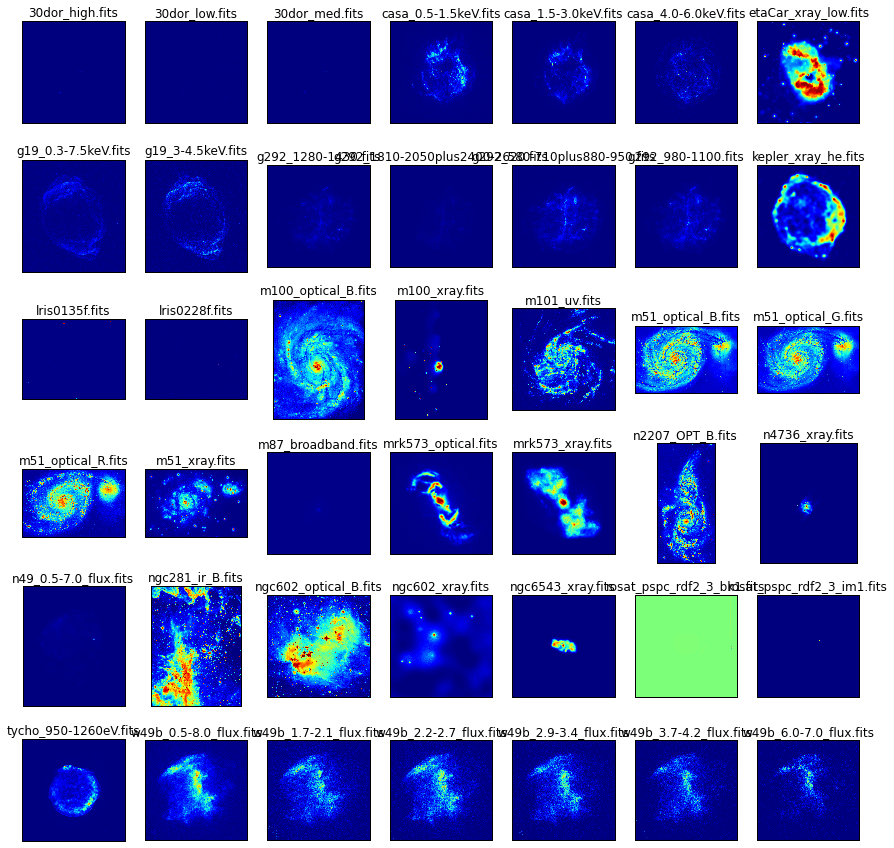

In [212]:
%matplotlib inline
import numpy as np
import os
#import pip
#pip.main(['install','--upgrade', 'numpy'])
#pip.main(['install', 'astropy'])
#pip.main(['install', 'easydev']) #'colormap'])
from astropy.io import fits

#Write your mean_fits function here:
def mean_fits(flist):
  x = fits.open(flist[0])[0].data
  for f in flist[1:]:
    x += fits.open(f)[0].data
  return x / len(flist)  

if __name__ == '__main__':
  # Test your function with examples from the question
  files = []
  for file in os.listdir("."):
    if file.endswith(".fits"):
      files.append(file)
  #print len(files)
  #data  = mean_fits(files)
  #print(data[100, 100])
  #plt.imshow(data.T, cmap=cmaps.viridis)
  #plt.colorbar()
  #plt.show()

  # You can also plot the result:
  import matplotlib.pyplot as plt
  import colormaps as cmaps
  i = 1
  plt.figure(figsize=(15,15))
  for f in files:
    plt.subplot(6,7,i);
    plt.imshow(fits.open(f)[0].data.T) #, cmap=cmaps.inferno)#viridis)
    plt.xticks([], []);plt.yticks([], []);plt.title(f)
    i += 1
  #plt.colorbar();
  #plt.tight_layout()
  #plt.show()

## 1. Computig the Mean and Median Stacks from a set of noisy FITS files

In this assignment, we shall focuss on calculating the *mean* of a stack of FITS files. Each individual file may or may not have a detected a **pulsar**, but in the final stack we should be able to see a **clear detection**.

### Computig the Mean FITS

The following figure shows *5 noisy FITS* files, which will be used to compute the mean FITS file. 

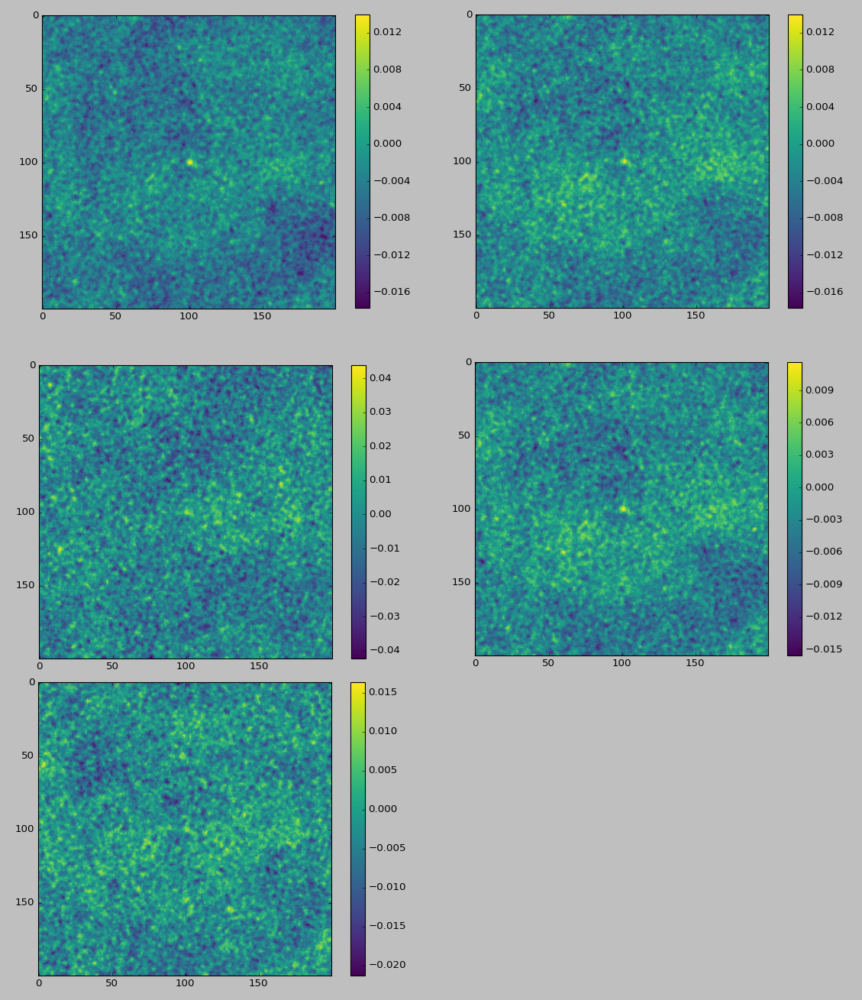

In [36]:
from IPython.display import Image
Image(filename='C:\\courses\\coursera\\Past\\ML\\Data Driven Astronomy\\f3.png')

The following figure shows the **mean FITS** file computed from thes above FITS files. Mean being an **algebraic** measure, it's possible to compute **running mean** by loadig each file at a time in the memory. 

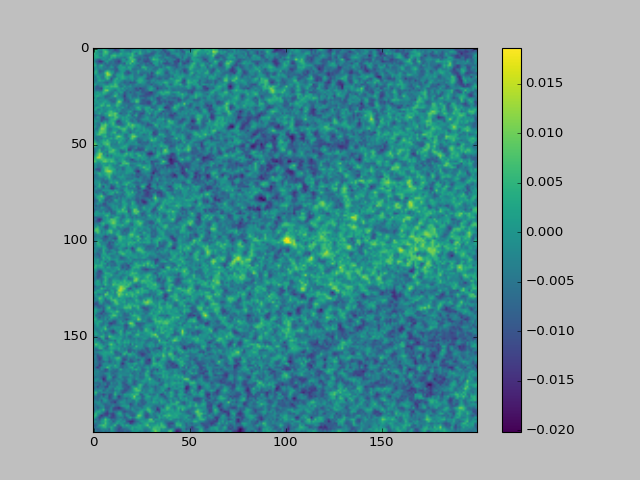

In [215]:
Image(filename='C:\\courses\\coursera\\Past\\ML\\Data Driven Astronomy\\imm.png')

### Computing the Median FITS

Now let's look at a different statistical measure — the median, which in many cases is considered to be a better measure than the mean due to its robustness to outliers. The median can be a more robust measure of the average trend of datasets than the mean, as the latter is easily skewed by outliers.

However, a naïve implementation of the median algorithm can be *very inefficient* when dealing with large datasets. *Median*, being a **holistic** measure, required all the datasets to be loaded in memory for exact computation, when implemeted i a naive manner.

Calculating the median requires all the data to be in memory at once. This is an issue in typical astrophysics calculations, which may use hundreds of thousands of FITS files. Even with a machine with lots of RAM, it's not going to be possible to find the median of more than a few tens of thousands of images.This isn’t an issue for calculating the mean, since the sum only requires one image to be added at a time. 

### Computing the approximate runing median: the BinApprox Algorithm

If there were a way to calculate a "running median" we could save space by only having one image loaded at a time. Unfortunately, there’s no way to do an exact running median, but there are ways to do it **approximately**.

The **binapprox** algorithm (http://www.stat.cmu.edu/~ryantibs/papers/median.pdf) does just this. The idea behind it is to find the median from the data's histogram. 

First of all it ca be proved that media always lies within one standard deviation of the mean, as show below:

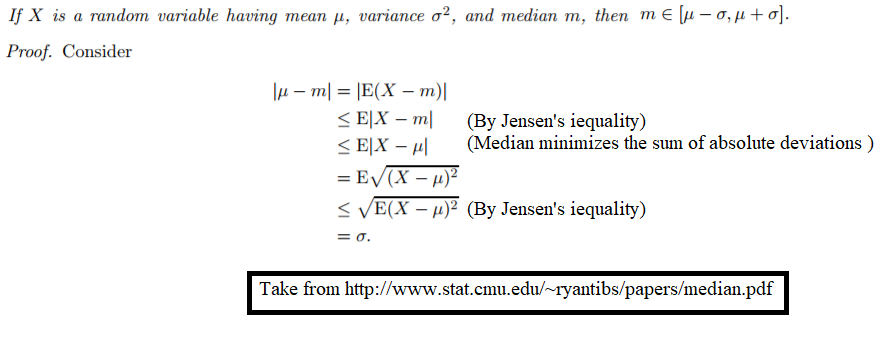

In [216]:
Image(filename='C:\\courses\\coursera\\Past\\ML\\Data Driven Astronomy\\f4.png')

The algorithm to find the **running approximate median** is show below:

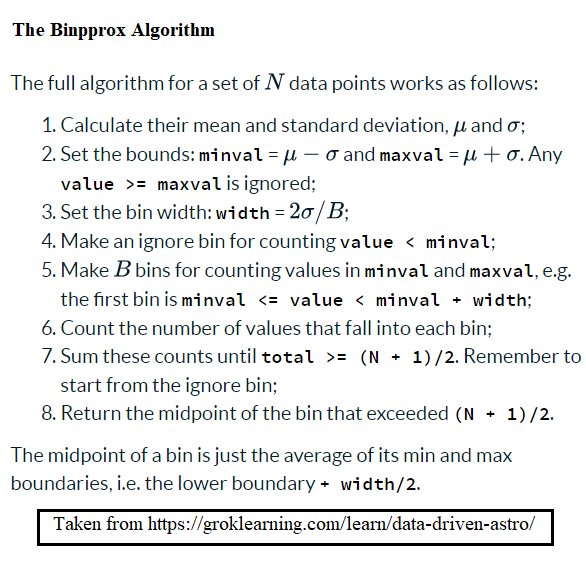

In [218]:
Image(filename='C:\\courses\\coursera\\Past\\ML\\Data Driven Astronomy\\f5.png')

As soon as the relevant bin is updated the data point being binned can be removed from memory. So if we're finding the median of a bunch of FITS files we only need to have one loaded at any time. (The mean and standard deviation can both be calculated from running sums so that still applies to the first step).

The downside of using binapprox is that we only get an answer accurate to $\dfrac{\sigma}{B}$ by using **B** bins. Scientific data comes with its own uncertainties though, so as long as you keep  large enough this isn't necessarily a problem.

The following figure shows the histogram of **1 million** data points generated randomly. Now, the **binapprox** algorithm will be used to compute the **runnig median** and the error in approximation will be computed with different number of bins **B**. 

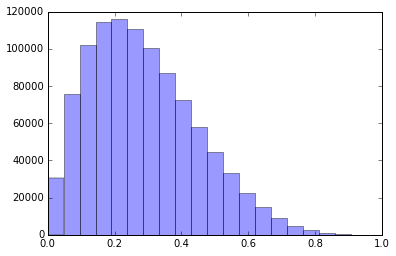

In [238]:
data = np.random.beta(2,5,1000000)
#pip.main(['install', 'seaborn'])

import seaborn as sns
sns.distplot(data, bins=20, kde=False, rug=False)

In [251]:
# Write your median_bins and median_approx functions here.
def median_bins(values, B):
	mu, sigma = np.mean(values), np.std(values)
	minval, maxval = mu - sigma, mu + sigma
	width = 2. * sigma / B
	bincounts = np.zeros(B)
	for value in values:
		if value >= minval and value < maxval:
			binindex = int((value - minval) / width)
			bincounts[binindex] += 1
	return (mu, sigma, int(sum(values < minval)), bincounts) 

def median_approx(values, B):
	mu, sigma, ignorebincount, bincounts = median_bins(values, B)
	N, width = len(values), 2. * sigma / B
	index = np.argwhere(np.cumsum(bincounts) >= (N+1)/2. - ignorebincount)
	#print mu - sigma, mu + sigma, np.cumsum(bincounts), (N+1)/2. - ignorebincount, index, width
	index = index[0][0] if index.shape[0] > 0 else (B-1)
	return (mu - sigma) + (index + 1/2.) * width

actual_med = np.median(data)
print(actual_med)
approx_meds = []
Bs = list(range(2,10)) + np.linspace(10, 200, 20).tolist()
for B in Bs:
    approx_med = median_approx(data, B)
    approx_meds.append(approx_med)
    print(B, approx_med)

0.264534512135
(2, 0.20580894849301745)
(3, 0.28566558193051567)
(4, 0.24573726521176656)
(5, 0.28566558193051567)
(6, 0.25904670411801622)
(7, 0.28566558193051567)
(8, 0.26570142357114113)
(9, 0.25017374484718313)
(10.0, 0.26969425524301605)
(20.0, 0.26170859189926621)
(30.0, 0.26969425524301605)
(40.0, 0.26570142357114113)
(50.0, 0.26330572456801615)
(60.0, 0.26703236746176606)
(70.0, 0.26513101904658753)
(80.0, 0.26370500773520367)
(90.0, 0.26614507153468275)
(100.0, 0.2649028572367661)
(110.0, 0.26388650008392522)
(120.0, 0.26570142357114113)
(130.0, 0.26478000087763154)
(140.0, 0.26399020999748046)
(150.0, 0.26543523479301612)
(160.0, 0.26470321565317234)
(170.0, 0.26405731641213381)
(180.0, 0.26525777560759944)
(190.0, 0.26465067839433193)
(200.0, 0.26410429090239113)


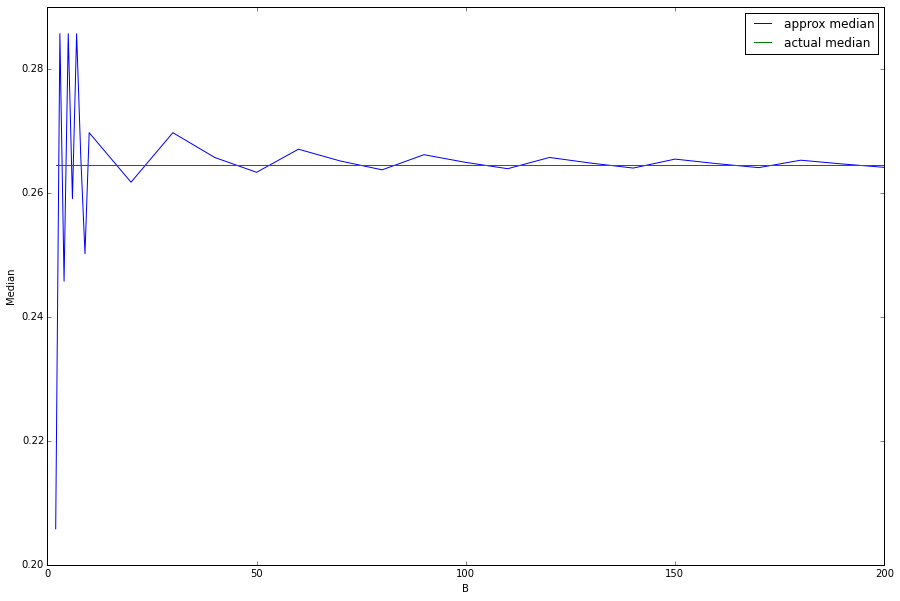

In [255]:
plt.figure(figsize=(15,10))
plt.plot(Bs, approx_meds, label='approx median')
plt.plot(Bs, [actual_med]*len(Bs), label='actual median')
plt.xlabel('B')
plt.ylabel('Median')
plt.legend()
plt.show()

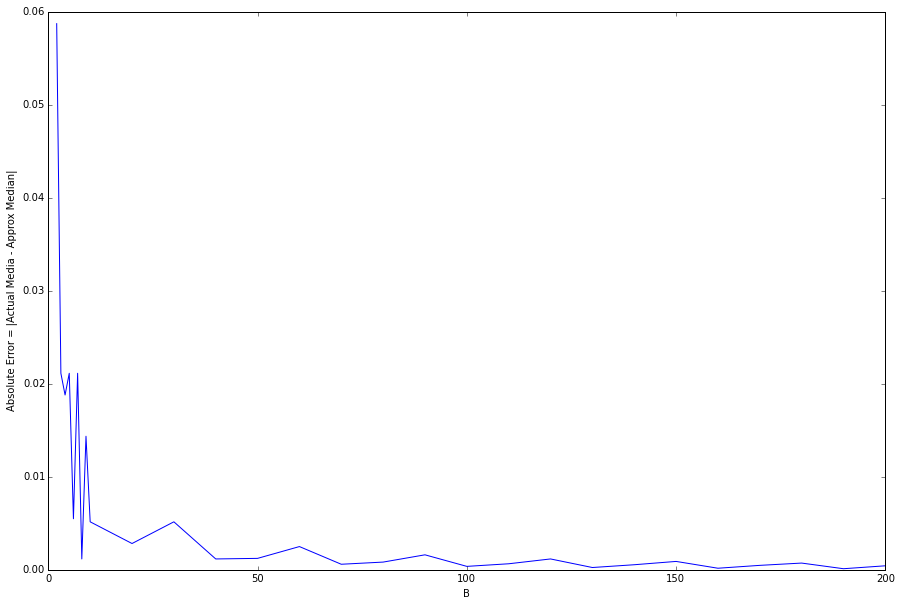

In [254]:
plt.figure(figsize=(15,10))
plt.plot(Bs, abs(approx_meds-actual_med), label='approx median')
plt.xlabel('B')
plt.ylabel('Absolute Error = |Actual Media - Approx Median|')
plt.show()

As can be see from above, as the number of bins **B** increases the **error** in **approximation** of the running median decreases.

Now we can use the **binapprox** algorithm to efficiently estimate the **median** of each pixel from a set of astronomy images in **FITS** files. The following figure shows *10 noisy FITS* files, which will be used to compute the median FITS file. 

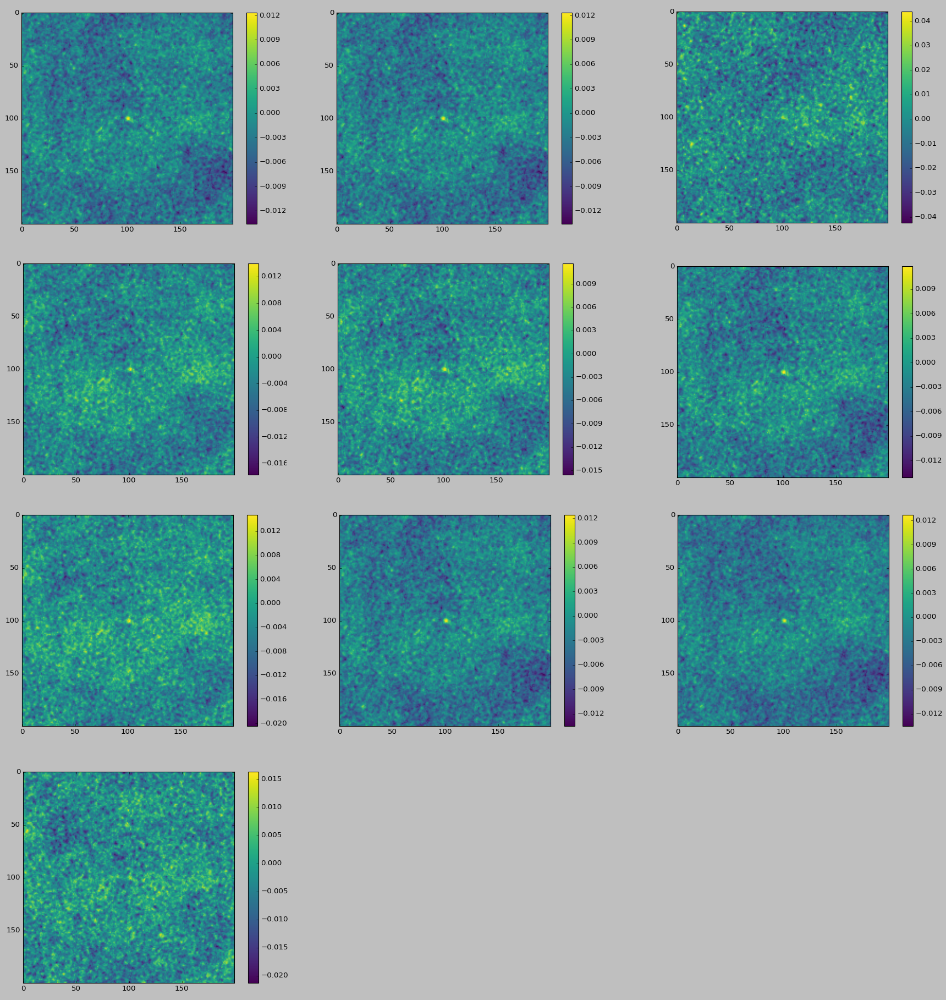

In [256]:
Image(filename='C:\\courses\\coursera\\Past\\ML\\Data Driven Astronomy\\f12.png')

The following figure shows the **median FITS** file computed from thes above FITS files using the **binapprox** algorithm. 

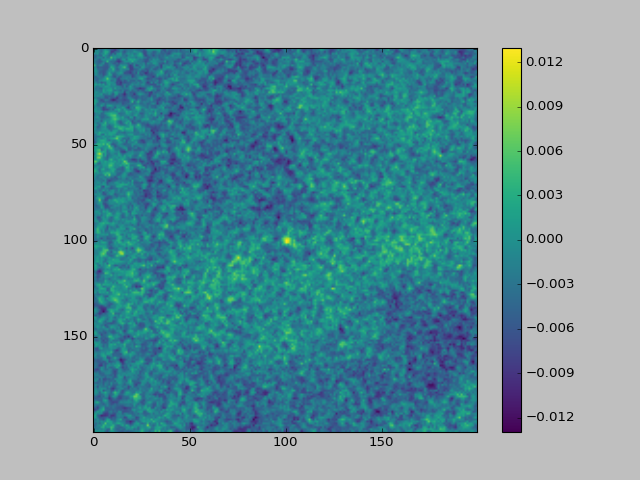

In [258]:
Image(filename='C:\\courses\\coursera\\Past\\ML\\Data Driven Astronomy\\immed.png')

#2. Cross-matching

When investigating astronomical objects, like **active galactic nuclei (AGN)**, astronomers compare data about those objects from different telescopes at different wavelengths.

This requires positional *cross-matching* to find the closest counterpart within a given radius on the sky.

In this activity you'll cross-match two catalogues: one from a radio survey, the **AT20G Bright Source Sample (BSS) catalogue** and one from an optical survey, the **SuperCOSMOS all-sky galaxy catalogue**.

The BSS catalogue lists the brightest sources from the AT20G radio survey while the SuperCOSMOS catalogue lists galaxies observed by visible light surveys. If we can find an optical match for our radio source, we are one step closer to working out what kind of object it is, e.g. a galaxy in the local Universe or a distant quasar.

We've chosen one small catalogue (BSS has only 320 objects) and one large one (SuperCOSMOS has about 240 million) to demonstrate the issues you can encounter when implementing cross-matching algorithms.

The positions of stars, galaxies and other astronomical objects are usually recorded in either equatorial or Galactic coordinates.

Equatorial coordinates are fixed relative to the celestial sphere, so the positions are independent of when or where the observations took place. They are defined relative to the celestial equator (which is in the same plane as the Earth's equator) and the ecliptic (the path the sun traces throughout the year).

A point on the celestial sphere is given by two coordinates:

1. *Right ascension*: the angle from the vernal equinox to the point, going east along the celestial equator;
2. *Declination*: the angle from the celestial equator to the point, going north (negative values indicate going south).

The vernal equinox is the intersection of the celestial equator and the ecliptic where the ecliptic rises above the celestial equator going further east.

* Right ascension is often given in hours-minutes-seconds (HMS) notation, because it was convenient to calculate when a star would appear over the horizon. A full circle in HMS notation is 24 hours, which means 1 hour in HMS notation is equal to 15 degrees. Each hour is split into 60 minutes and each minute into 60 seconds.

* Declination, on the other hand, is traditionally recorded in degrees-minutes-seconds (DMS) notation. A full circle is 360 degrees, each degree has 60 arcminutes and each arcminute has 60 arcseconds.

To crossmatch two catalogues we need to compare the angular distance between objects on the celestial sphere.

People loosely call this a "distance", but technically its an angular distance: the projected angle between objects as seen from Earth.

Angular distances have the same units as angles (degrees). There are other equations for calculating the angular distance but this one, called the **haversine formula**, is good at avoiding floating point errors when the two points are close together.

If we have an object on the celestial sphere with right ascension and declination $(\alpha_1, \delta_1)$, then the angular distance to another object with coordinates $(\alpha_2, \delta_2)$ is given below:

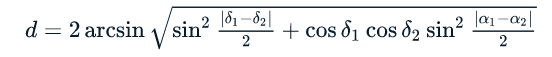

In [43]:
from IPython.display import Image
Image(filename='C:\\courses\\coursera\\Past\\ML\\Data Driven Astronomy\\f1.png')

Before we can crossmatch our two catalogues we first have to import the raw data. Every astronomy catalogue tends to have its own unique format so we'll need to look at how to do this with each one individually.

We'll look at the AT20G bright source sample survey first. The raw data we'll be using is the file table2.dat from this page (http://cdsarc.u-strasbg.fr/viz-bin/Cat?J/MNRAS/384/775#sRM2.2) in the VizieR archives, but we'll use the filename bss.dat from now on.

Every catalogue in VizieR has a detailed README file that gives you the exact format of each table in the catalogue.

The full catalogue of bright radio sources contains 320 objects. The first few rows look like this (scroll right to see it all):

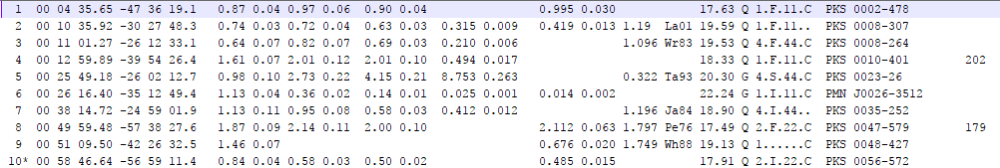

In [54]:
Image(filename='C:\\courses\\coursera\\Past\\ML\\Data Driven Astronomy\\f2.png')

The catalogue is organised in fixed-width columns, with the format of the columns being:

* 1: Object catalogue ID number (sometimes with an asterisk)
* 2-4: Right ascension in HMS notation
* 5-7: Declination in DMS notation
* 8-: Other information, including spectral intensities

The SuperCOSMOS all-sky catalogue is a catalogue of galaxies generated from several visible light surveys.

The original data is available on this page (http://ssa.roe.ac.uk/allSky) in a package called SCOS_stepWedges_inWISE.csv.gz. The file is exxtracted to a csv file named super.csv.

The first few lines of super.csv look like this:

In [64]:
import pandas as pd
super_csv = pd.read_csv('C:/courses/Coursera/Past/ML/Data Driven Astronomy/super.csv')
#print(super_csv.shape)
super_csv.head(10)

,objID,ra,dec,Bmag,Bcal,Bcc,Rmag,Rcal,Rcc,Imag,Ical,Icc,Ebmv,plateno
0,284,340.04233,81.963910,19.384,19.384,18.521,19.733,19.733,19.173,29.999,29.999,29.577,0.251,1002
1,461,340.16876,81.979240,19.696,19.696,18.864,19.967,19.967,19.427,29.999,29.999,29.592,0.242,1002
2,2890,340.89240,82.514860,16.178,16.178,15.493,15.302,15.302,14.858,14.234,14.234,13.900,0.199,1002
3,3213,344.86774,82.563800,20.128,20.128,19.306,19.072,19.072,18.539,29.999,29.999,29.597,0.239,1002
4,3725,340.98456,82.633820,20.069,20.069,19.274,19.645,19.645,19.130,29.999,29.999,29.611,0.231,1002
5,57480,111.22400,-86.837395,21.169,21.401,20.995,18.301,18.391,18.128,18.266,18.258,18.060,0.118,1
6,58476,330.11264,-86.405190,19.695,19.769,19.287,18.029,18.027,17.715,29.999,32.566,32.331,0.140,1
7,58697,325.21265,-86.221660,20.275,20.415,19.909,18.030,18.061,17.733,17.561,17.584,17.337,0.147,1
8,58740,324.78040,-86.191840,20.309,20.414,19.901,18.361,18.373,18.041,29.999,32.406,32.156,0.149,1
9,58849,322.62088,-86.094430,20.923,21.144,20.642,18.122,18.204,17.878,29.999,32.521,32.276,0.146,1


The catalogue uses a comma-separated value (CSV) format. Aside from the first row, which contains column labels, the format is:

* 1: Right ascension in decimal degrees
* 2: Declination in decimal degrees
* 3: Other data, including magnitude and apparent shape.

### Naive Cross-matcher

Let's implement a naive **crossmatch** function that crossmatches two catalogues within a maximum distance and returns a list of matches and non-matches for the first catalogue (BSS) against the second (SuperCOSMOS). The maximum distance is given in decimal degrees (e.g., nearest objects within a distance of $5^o$ will be considered to be matched).

There are *320* objects in the *BSS* catalogue that are compared with first *n* objects from the *SuperCOSMOS* catalogue. The values of *n* is gradually increased from *500* to *1,25,000* and impact on the running time and the number of matched objected are noted.  

In [176]:
# Write your crossmatch function here.
def hms2dec(h, m, s):  
	return((1 if h >= 0 else -1)*15*(np.abs(h) + m/60. + s/(60.*60.))) #np.sign(h) 
	
def dms2dec(h, m, s):  
	return((1 if h >= 0 else -1)*(np.abs(h) + m/60. + s/(60.*60.))) #np.sign(h)

def angular_dist(ra1, dec1, ra2, dec2):
	ra1, dec1, ra2, dec2 = ra1*(np.pi/180), dec1*(np.pi/180), ra2*(np.pi/180), dec2*(np.pi/180)
	return 2*np.arcsin(np.sqrt(np.sin(np.abs(dec1 - dec2)/2)**2 + np.cos(dec1)*np.cos(dec2)*np.sin(np.abs(ra1 - ra2)/2)**2))*(180/np.pi)

def import_bss():	
	cat = np.loadtxt('C:/courses/Coursera/Past/ML/Data Driven Astronomy/bss.dat', usecols=range(1, 7))
	#print(cat[0])
	return [(i+1, hms2dec(cat[i][0],cat[i][1],cat[i][2]), dms2dec(cat[i][3],cat[i][4],cat[i][5])) for i in range(len(cat))]
	
def import_super():
	cat = np.loadtxt('C:/courses/Coursera/Past/ML/Data Driven Astronomy/super.csv', delimiter=',', skiprows=1, usecols=[1, 2])
	return [tuple([i+1] + cat[i].tolist()) for i in range(len(cat))]
  
def find_closest(cat, ra, dec):
	min_dist, min_id = float('Inf'), -1
	for target in cat:
		target_id, ra2, dec2 = target
		dist = angular_dist(ra, dec, ra2, dec2)
		if dist < min_dist:
			min_dist, min_id = dist, target_id
	return (min_id, min_dist)		


def crossmatch(bss_cat, super_cat, max_dist):
	matched, nonmatched = [], []
	for source in bss_cat:
		source_id, ra1, dec1 = source
		target_id, dist = find_closest(super_cat, ra1, dec1)
		if dist <= max_dist:
			matched.append((source_id, target_id, dist))
		else:
			nonmatched.append(source_id)
		#found = False
		#for target in super_cat:
		#	target_id, ra2, dec2 = target
		#	dist = angular_dist(ra1, dec1, ra2, dec2)
		#	if dist <= max_dist:
		#		matched.append((source_id, target_id, dist))
		#		found = True
		#if not found:
		#	nonmatched.append(source_id)
	return (matched, nonmatched)

In [190]:
import time
bss_cat = import_bss()
super_cat = import_super()
max_dist = 5 #100/3600. # 100 arcseconds
start = time.time()
ns = map(int, np.linspace(500, 1000, 2).tolist() + np.linspace(2000, 20000, 4).tolist() + np.linspace(25000, 125000, 5).tolist())
times, nmatches, nnomatches = [], [], []
#np.random.seed(0)
for n in ns:
    super_cat1 = super_cat[:n] #[super_cat[i] for i in map(int, np.random.choice(len(super_cat),n).tolist())] # #
    matches, no_matches = crossmatch(bss_cat, super_cat1, max_dist)
    end = time.time()
    elapsed = end - start
    print(n, elapsed, len(matches), len(no_matches))
    times.append(elapsed)
    nmatches.append(len(matches))
    no_matches.append(len(no_matches))

(500, 1.5090000629425049, 17, 303)
(1000, 4.545000076293945, 19, 301)
(2000, 10.595999956130981, 26, 294)
(8000, 36.234999895095825, 58, 262)
(14000, 81.02799987792969, 79, 241)
(20000, 143.0590000152588, 97, 223)
(25000, 220.82299995422363, 114, 206)
(50000, 377.6080000400543, 219, 101)
(75000, 613.300999879837, 320, 0)
(100000, 932.1579999923706, 320, 0)
(125000, 1327.9860000610352, 320, 0)


The below figures shows the time taken for the *naive cross-matching* as the umber of objects in the *second* catalogue is increased and also the final matches produced as a *bipartite graph*.  

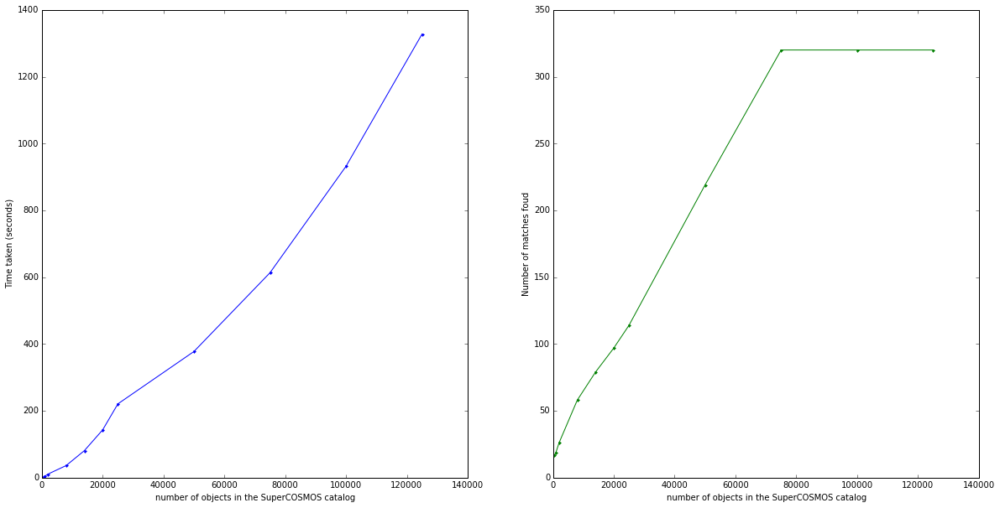

In [204]:
plt.figure(figsize=(20,10))
plt.subplot(121); plt.plot(ns, times, '.-'); plt.xlabel('number of objects in the SuperCOSMOS catalog'); plt.ylabel('Time taken (seconds)');
plt.subplot(122); plt.plot(ns, nmatches, 'g.-'); plt.xlabel('number of objects in the SuperCOSMOS catalog'); plt.ylabel('Number of matches foud');
plt.show()

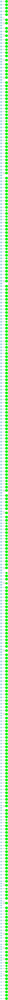

In [193]:
#pip.main(['install', 'graphviz']) 
from graphviz import Digraph
s = Digraph('crossmatch', node_attr={'shape': 'plaintext'}, format='png') #,engine='neato')
s.body.extend(['rankdir=LR'])
s.attr('node', style='filled', color='lightblue2', shape='circle')
for e in matches: s.node('B'+str(e[0]))
s.attr('node', style='filled', color='green', shape='circle')
for e in matches: s.node('C'+str(e[1]))
for e in matches: s.edge('B'+str(e[0]), 'C'+str(e[1]), label=str(round(e[2],6)))
s.render('C:\\courses\\coursera\\Past\\ML\\Data Driven Astronomy\\bipartite', view=False)
Image(filename='C:\\courses\\coursera\\Past\\ML\\Data Driven Astronomy\\bipartite.png')#,width=200, height=2000)

### An efficient Cross-matcher

Crossmatching is a very common task in astrophysics, so it's natural that it's had optimised implementations written of it already. A popular implementation uses objects called k-d trees to perform crossmatching incredibly quickly, by constructing a 
**k-d tree** out of the *second catalogue*, letting it search through for a match for each object in the *first catalogue* efficiently. Constructing a k-d tree is similar to binary search: the *k-dimensional* space is divided into two parts recursively until each division only contains only a single object. Creating a k-d tree from an astronomy catalogue works like this:

1. Find the object with the median right ascension, split the catalogue into objects left and right partitions of this
2. Find the objects with the median declination in each partition, split the partitions into smaller partitions of objects down and up of these
3. Find the objects with median right ascension in each of the partitions, split the partitions into smaller partitions of objects left and right of these
4. Repeat 2-3 until each partition only has one object in it

This creates a binary tree where each object used to split a partition (a node) links to the two objects that then split the partitions it has created (its children), similar to the one show in the image below.

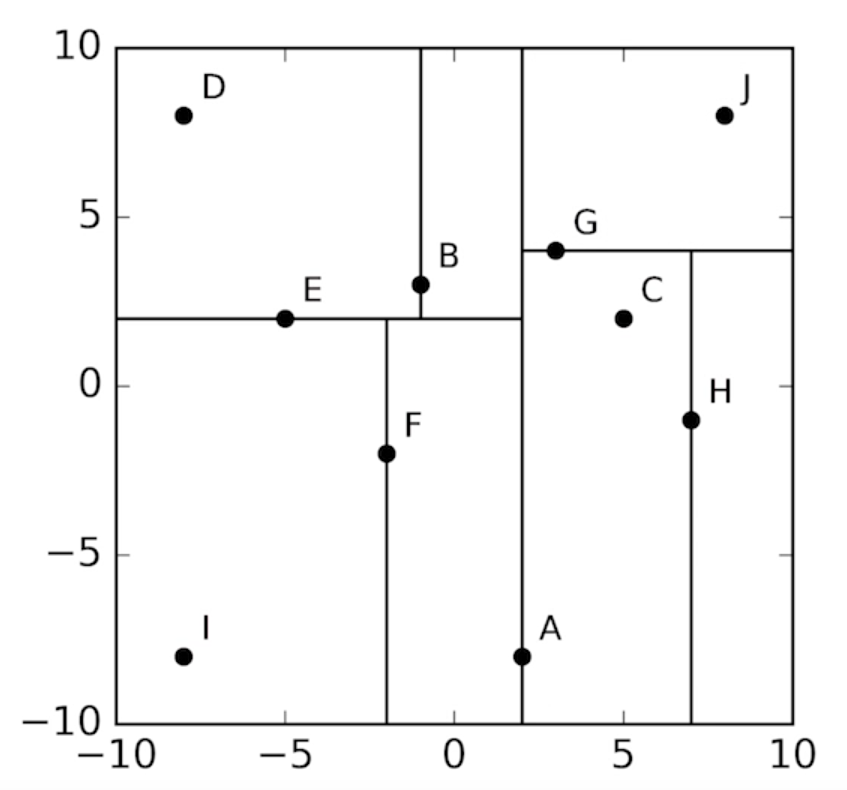

In [139]:
Image(filename='C:\\courses\\coursera\\Past\\ML\\Data Driven Astronomy\\k-d_tree_standin.png', width=400, height=400)

Once a *k-d tree* is costructed out of a catalogue, finding a match to an object then works like this:

1. Calculate the distance from the object to highest level node (the root node), then go to the child node closest (in right ascension) to the object
2. Calculate the distance from the object to this child, then go to the child node closest (in declination) to the object
3. Calculate the distance from the object to this child, then go to the child node closest (in right ascension) to the object
4. Repeat 2-3 until you reach a child node with no further children (a leaf node)
5. Find the shortest distance of all distances calculated, this corresponds to the closest object

Since each node branches into two children, a catalogue of objects will have, on average, $\log_{2}(N)$ nodes from the root to any leaf, as show in the followig figure. 

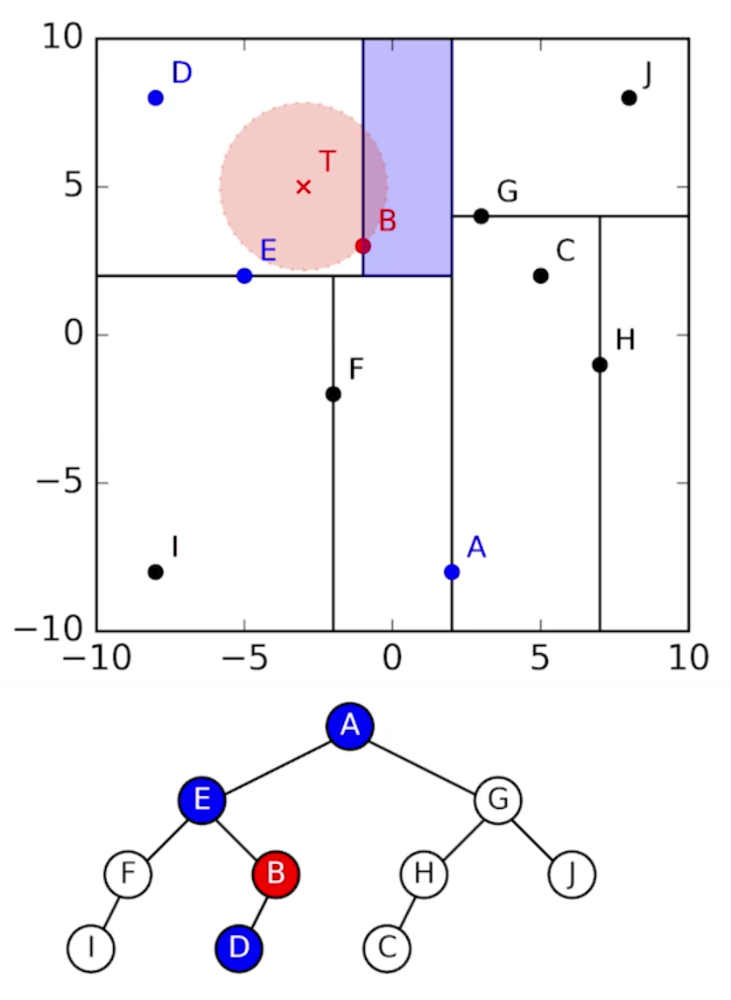

In [141]:
Image(filename='C:\\courses\\coursera\\Past\\ML\\Data Driven Astronomy\\k-d_tree_search_standin2.png', width=400, height=400)

In [194]:
from astropy.coordinates import SkyCoord
from astropy import units as u
import re

def dms2dec(h, m, s):  
	return((1 if h >= 0 else -1)*(np.abs(h) + m/60. + s/(60.*60.))) #np.sign(h)

def crossmatch2(cat1, cat2, max_dist):
    
	sky_cat1 = SkyCoord(cat1*u.degree, frame='icrs')
	sky_cat2 = SkyCoord(cat2*u.degree, frame='icrs')
	closest_ids, closest_dists, closest_dists3d = sky_cat1.match_to_catalog_sky(sky_cat2)
	matched, nonmatched = [], []
	for i in range(len(cat1)):
		source_id, target_id, dist = i, closest_ids[i], str(closest_dists[i])
		d, m, s = map(float, re.findall("\d+\.*\d*", str(dist)))
		dist = dms2dec(d, m, s)
		#print(d,m,s)
		if dist <= max_dist:
			matched.append((source_id, target_id, dist))
		else:
			nonmatched.append(source_id)
	return (matched, nonmatched)

In [207]:
def import_bss2():	
	cat = np.loadtxt('C:/courses/Coursera/Past/ML/Data Driven Astronomy/bss.dat', usecols=range(1, 7))
	#print(cat[0])
	return np.array([[hms2dec(cat[i][0],cat[i][1],cat[i][2]), dms2dec(cat[i][3],cat[i][4],cat[i][5])] for i in range(len(cat))])
	
def import_super2():
	cat = np.loadtxt('C:/courses/Coursera/Past/ML/Data Driven Astronomy/super.csv', delimiter=',', skiprows=1, usecols=[1, 2])
	return cat #np.array([cat[i].tolist() for i in range(len(cat))])

bss_cat = import_bss2()
super_cat = import_super2()
max_dist = 5 #100/3600. # 100 arcseconds
start = time.time()
times2, nmatches2, nnomatches2 = [], [], []
#np.random.seed(0)
for n in ns:
    super_cat1 = super_cat[:n,:] #[super_cat[i] for i in map(int, np.random.choice(len(super_cat),n).tolist())] # #
    matches, no_matches = crossmatch2(bss_cat, super_cat1, max_dist)
    end = time.time()
    elapsed = end - start
    print(n, elapsed, len(matches), len(no_matches))
    times2.append(elapsed)
    nmatches2.append(len(matches))
    nnomatches2.append(len(no_matches))

(500, 0.07800006866455078, 17, 303)
(1000, 0.15700006484985352, 19, 301)
(2000, 0.24399995803833008, 26, 294)
(8000, 0.3299999237060547, 58, 262)
(14000, 0.41899991035461426, 79, 241)
(20000, 0.5139999389648438, 97, 223)
(25000, 0.6050000190734863, 114, 206)
(50000, 0.7070000171661377, 219, 101)
(75000, 0.818000078201294, 320, 0)
(100000, 0.9409999847412109, 320, 0)
(125000, 1.0720000267028809, 320, 0)


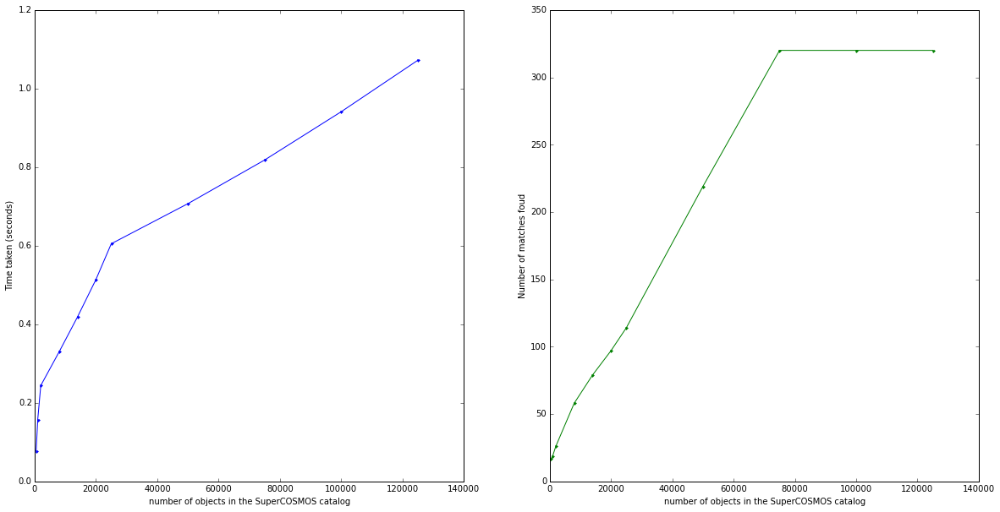

In [208]:
plt.figure(figsize=(20,10))
plt.subplot(121); plt.plot(ns, times2, '.-'); plt.xlabel('number of objects in the SuperCOSMOS catalog'); plt.ylabel('Time taken (seconds)');
plt.subplot(122); plt.plot(ns, nmatches2, 'g.-'); plt.xlabel('number of objects in the SuperCOSMOS catalog'); plt.ylabel('Number of matches foud');
plt.show()

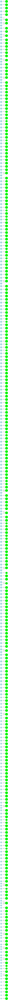

In [209]:
#pip.main(['install', 'graphviz']) 
s = Digraph('crossmatch', node_attr={'shape': 'plaintext'}, format='png') #,engine='neato')
s.body.extend(['rankdir=LR'])
s.attr('node', style='filled', color='lightblue2', shape='circle')
for e in matches: s.node('B'+str(e[0]))
s.attr('node', style='filled', color='green', shape='circle')
for e in matches: s.node('C'+str(e[1]))
for e in matches: s.edge('B'+str(e[0]), 'C'+str(e[1]), label=str(round(e[2],6)))
s.render('C:\\courses\\coursera\\Past\\ML\\Data Driven Astronomy\\bipartite2', view=False)
Image(filename='C:\\courses\\coursera\\Past\\ML\\Data Driven Astronomy\\bipartite2.png')#,width=200, height=2000)

As can be seen above, the **kd-tree** based implementatio is way more faster than the **naive** counterpart for crossmatching. When the **naive** takes **> 20 mins** to match against **1,25,000** objects in the *second* catalog, the **kd-tree** based implemetation takes just about **1 second** to produce the same set of results, as show above.  

## 3. Building a Regressor to predict Redshift

The Sloan data (*sdss_galaxy_colors*) is going to be used for this purpose, the first few rows are shown below. The columns **'u'**-**'z'** are the flux magnitude columns. The data also includes **spec_class** and **redshift_err** columns. 

In [62]:
import pandas as pd
df = pd.read_csv('C:\\courses\\coursera\\Past\\ML\\Data Driven Astronomy\\sdss_galaxy_colors.csv')
df.head()
#print(set(df.iloc[:,5]))
#from pandas import compat
#compat.PY3 = True
#df.columns = [col.encode('ascii', 'ignore') for col in df]
#print(df.columns)
#print(df['u'])

,u,g,r,i,z,spec_class,redshift,redshift_err
0,19.84132,19.52656,19.46946,19.17955,19.10763,b'QSO',0.539301,0.000065
1,19.86318,18.66298,17.84272,17.38978,17.14313,b'GALAXY',0.164570,0.000012
2,19.97362,18.31421,17.47922,17.07440,16.76174,b'GALAXY',0.041900,0.000022
3,19.05989,17.49459,16.59285,16.09412,15.70741,b'GALAXY',0.044277,0.000011
4,19.45567,18.33084,17.67185,17.30189,17.13650,b'GALAXY',0.041644,0.000018


Now let's compute four colour features **u - g, g - r, r - i** and **i - z**. Our targets are the corresponding **redshifts**. The following shows the preprocessed data ready for training the regression model.

In [72]:
df1 = pd.read_csv('C:\\courses\\coursera\\Past\\ML\\Data Driven Astronomy\\sdss_processed_data.csv')
df1.head()
#import numpy as np
#print(df.iloc[np.random.choice(df.shape[0], 5)])

,u - g,g - r,r - i,i - z,redshift
0,0.31476,0.05710,0.28991,0.07192,0.539301
1,1.20020,0.82026,0.45294,0.24665,0.164570
2,1.65941,0.83499,0.40482,0.31266,0.041900
3,1.56530,0.90174,0.49873,0.38671,0.044277
4,1.12483,0.65899,0.36996,0.16539,0.041644


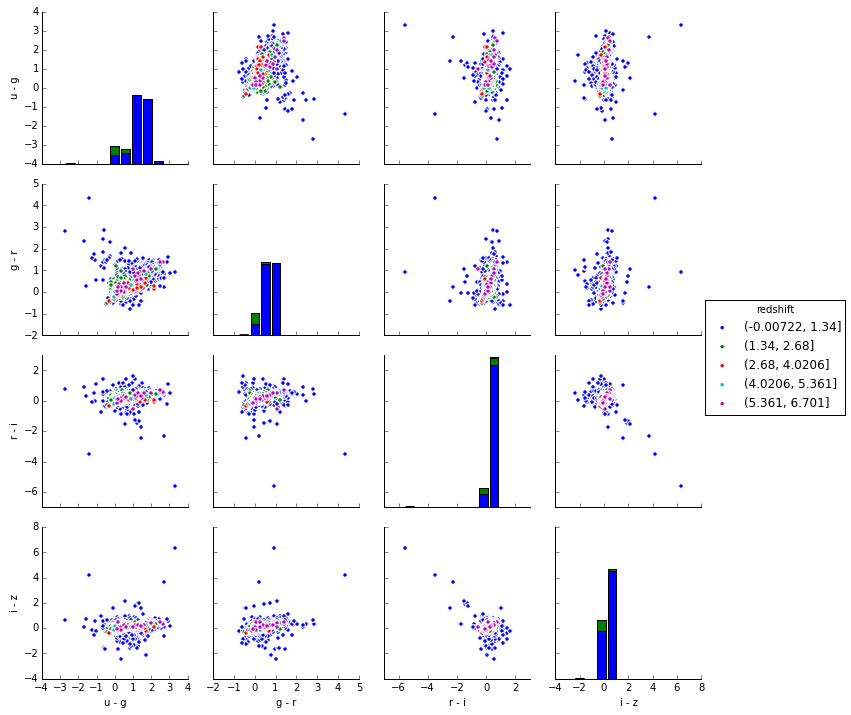

In [73]:
# import seaborn as sns
df1.redshift = pd.cut(df1.redshift, 5)
g = sns.pairplot(df1, hue="redshift") #df.iloc[:, :4]

Now let's split our data into training and testing subsets, use our features and targets to train a regression tree from the training dataset and then make a prediction on the held-out dataset. How do we know if the tree is actually any good at predicting redshifts?

In regression we compare the predictions generated by our model with the actual values to test how well our model is performing. The difference between the predicted values and actual values (sometimes referred to as residuals) can tell us a lot about where our model is performing well and where it is not.

While there are a few different ways to characterise these differences, we will use the median of the differences between our predicted and actual values. This is given by

In [38]:
Image(filename='C:\\courses\\coursera\\Past\\ML\\Data Driven Astronomy\\f13.png', width=400, height=50)

This method of validation is the most basic approach to validation and is called *held-out validation*. We will use the *med_diff* accuracy measure and hold-out validation to assess the accuracy of our decision tree.

In [158]:
from sklearn.tree import DecisionTreeRegressor,export_graphviz

# paste your get_features_targets function here
def get_features_targets(data):
  # complete this function
  features = np.zeros((data.shape[0], 4))
  features[:, 0] = data['u'] - data['g']
  features[:, 1] = data['g'] - data['r']
  features[:, 2] = data['r'] - data['i']
  features[:, 3] = data['i'] - data['z']
  return (features, data['redshift']) 


# paste your median_diff function here
def median_diff(predicted, actual):
	return np.median(abs(predicted - actual))	


# write a function that splits the data into training and testing subsets
# trains the model and returns the prediction accuracy with median_diff
def validate_model(model, features, targets):
  # split the data into training and testing features and predictions
  split = features.shape[0]//2
  train_features = features[:split]
  train_targets = targets[:split]
  test_features = features[split:]
  test_targets = targets[split:]

  # train the model
  # initialise and train the decision tree
  dtr.fit(train_features, train_targets)

  # get the predicted_redshifts
  # get a set of prediction from the test input features
  predictions = dtr.predict(test_features)

  # use median_diff function to calculate the accuracy
  return abs(predictions - test_targets), median_diff(test_targets, predictions)

features, targets = get_features_targets(df)

# initialize model
dtr = DecisionTreeRegressor()#max_depth=5)

# validate the model and print the med_diff
diffs, diff = validate_model(dtr, features, targets)  
print('Median difference: {:f}'.format(diff))

Median difference: 0.022068


A plot of how the colours change with redshift tells us that it is quite a complex function, for example *redshift* versus *u - g*:

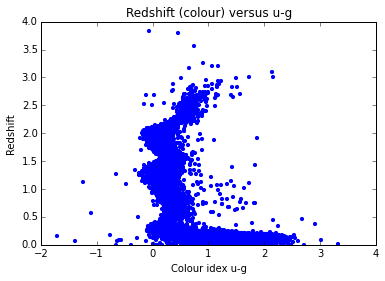

In [182]:
import matplotlib.pylab as plt

# Define our colour indexes u-g and r-i
u_g = df['u'] - df['g']

# Make a redshift array
r_s = df['redshift']

# Create the plot with plt.scatter and plt.colorbar
plt.scatter(u_g, r_s, color='b', s=10)

# Define your axis labels and plot title
plt.xlabel('Colour idex u-g')
plt.ylabel('Redshift')
plt.title('Redshift (colour) versus u-g')

# Set any axis limits
plt.ylim(0, 4)
plt.show()

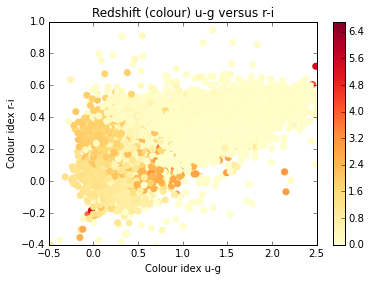

In [159]:
import matplotlib.pylab as plt
cmap = plt.get_cmap('YlOrRd')

# Define our colour indexes u-g and r-i
u_g = df['u'] - df['g']
r_i = df['r'] - df['i']

# Make a redshift array
r_s = df['redshift']

# Create the plot with plt.scatter and plt.colorbar
plt.scatter(u_g, r_i, c=r_s, s=50, cmap=cmap, lw=0)
plt.colorbar()

# Define your axis labels and plot title
plt.xlabel('Colour idex u-g')
plt.ylabel('Colour idex r-i')
plt.title('Redshift (colour) u-g versus r-i')

# Set any axis limits
plt.xlim(-0.5, 2.5)
plt.ylim(-0.4, 1.0)


plt.show()

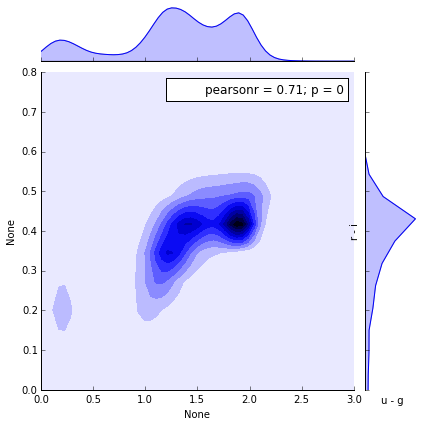

In [172]:
sns.jointplot(u_g, r_i, kind="kde", xlim=(0,3), ylim=(0,0.8))
plt.xlabel('u - g')
plt.ylabel('r - i')
plt.show()

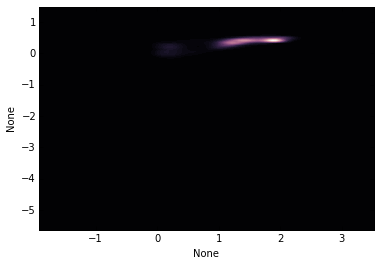

In [144]:
cmap = sns.cubehelix_palette(as_cmap=True, dark=0, light=1, reverse=True)
sns.kdeplot(u_g, r_i, cmap=cmap, n_levels=60, shade=True, xlim=(0,1), ylim=(0,1))

The median of differences of *~ 0.02* means that half of our galaxies have a error in the prediction of *< 0.02*, which is pretty good. One of the reason we chose the median of differences as our accuracy measure is that it gives a fair representation of the errors especially when the distribution of errors is skewed. The graph below shows the distribution of residuals (differences) for our model along with the median and interquartile values.

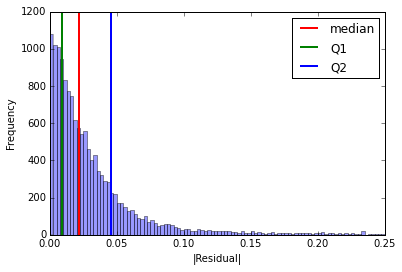

In [170]:
#print(diffs.iloc(0))
sns.distplot(diffs[diffs<0.25], bins=100, kde=False, rug=False)
plt.axvline(diffs.median(), color='r', linewidth=2, label='median') #linestyle='dashed', 
plt.axvline(diffs.quantile(q=0.25), color='g', linewidth=2, label='Q1') #linestyle='dashed', 
plt.axvline(diffs.quantile(q=0.75), color='b', linewidth=2, label='Q2') #linestyle='dashed', 
plt.xlabel('|Residual|')
plt.ylabel('Frequency')
plt.legend()
plt.show()
#plt.hist(diffs)#, bins=20, color='c')

### Overfitting

Decision / Regression trees have some limitations though, one of the biggest being they tend to over fit the data. What this means is that if they are left unchecked they will create an overly complicated tree that attempts to account for outliers in the data. This comes at the expense of the accuracy of the general trend.

Part of the reason for this over-fitting is that the algorithm works by trying to optimise the decision locally at each node. There are ways in which this can be mitigated and in the next problem we will see how constraining the number of decision node rows (the tree depth) impacts on the accuracy of our predictions.

In order to see how the regression tree is *overfitting* we would like to examine how our decision tree performs for different tree depths. Specifically, we would like to see how it performs on test data compared to the data that was used to train it.

Naïvely we'd expect, the *deeper* the tree, the better it should perform. However, as the model overfits we see a difference in its accuracy on the training data and the more general testing data.

The following figure shows a decision tree with *maximum depth 5* learnt from the training dataset.

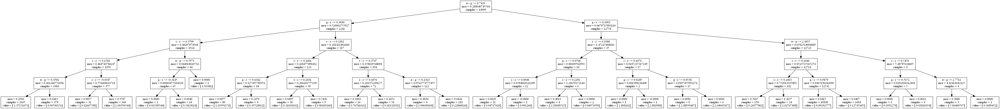

In [115]:
#print(dir(dtr))
from StringIO import StringIO
dotfile = StringIO()
export_graphviz(dtr, out_file=dotfile,feature_names=['u - g', 'g - r', 'r - i', 'i - z'])
#export_graphviz(dtr, out_file='C:\\courses\\coursera\\Past\\ML\\Data Driven Astronomy\\rtree.dot',feature_names=['u - g', 'g - r', 'r - i', 'i - z'])
#import pip
#pip.main(['install', 'pydot'])
#import pydot 
import pydotplus as pydotplus
#pydot.graph_from_dot_data(dotfile.getvalue()).write_png("C:\\courses\\coursera\\Past\\ML\\Data Driven Astronomy\\regression_tree.png")
graph = pydotplus.graph_from_dot_data(dotfile.getvalue())
graph.write_png("C:\\courses\\coursera\\Past\\ML\\Data Driven Astronomy\\regression_tree.png")
Image(filename='C:\\courses\\coursera\\Past\\ML\\Data Driven Astronomy\\regression_tree.png')

We can see that the accuracy of the regression tree on the training set gets better as we allow the tree to grow to greater depths. In fact, at a depth of 27 our errors goes to zero!

Conversly, the accuracy measure of the predictions for the test set gets better initially and then worse at larger tree depths. At a tree depth ~19 the regression tree starts to overfit the data. This means it tries to take into account outliers in the training set and loses its general predictive accuracy.

Overfitting is a common problem with decision / regression trees and can be circumvented by adjusting parameters like the tree depth or setting a minimum number of cases at each node. For now, we will set a maximum tree depth of 19 to prevent over-fitting in our redshift problem.

Depth with lowest median difference : 19


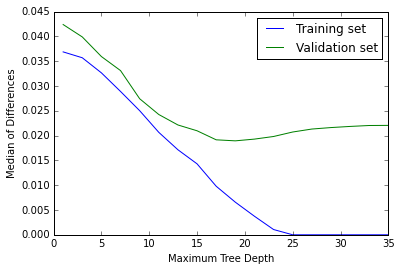

In [157]:
# Complete the following function
def accuracy_by_treedepth(features, targets, depths):
  # split the data into testing and training sets
  split = features.shape[0]//2
  train_features = features[:split]
  train_targets = targets[:split]
  test_features = features[split:]
  test_targets = targets[split:]

  # initialise arrays or lists to store the accuracies for the below loop
  train_med_diffs, test_med_diffs = [], []
  
  # loop through depths
  for depth in depths:
    # initialize model with the maximum depth. 
    dtr = DecisionTreeRegressor(max_depth=depth)

    # train the model using the training set
    dtr.fit(train_features, train_targets)

    # get the predictions for the training set and calculate their median_diff
    predictions = dtr.predict(train_features)
    train_med_diffs.append(median_diff(train_targets, predictions))
    
    # get the predictions for the testing set and calculate their median_diff
    predictions = dtr.predict(test_features)
    test_med_diffs.append(median_diff(test_targets, predictions))
       
  # return the accuracies for the training and testing sets
  return (train_med_diffs, test_med_diffs)

# Generate several depths to test
tree_depths = [i for i in range(1, 36, 2)]

# Call the function
train_med_diffs, test_med_diffs = accuracy_by_treedepth(features, targets, tree_depths)
print("Depth with lowest median difference : {}".format(tree_depths[test_med_diffs.index(min(test_med_diffs))]))

# Plot the results
train_plot = plt.plot(tree_depths, train_med_diffs, label='Training set')
test_plot = plt.plot(tree_depths, test_med_diffs, label='Validation set')
plt.xlabel("Maximum Tree Depth")
plt.ylabel("Median of Differences")
plt.legend()
plt.show()

### K-Fold cross validation 

The method we used to validate our model so far is known as hold-out validation. Hold out validation splits the data in two, one set to test with and the other to train with. Hold out validation is the most basic form of validation.

While hold-out validation is better than no validation, the measured accuracy (i.e. our median of differences) will vary depending on how we split the data into testing and training subsets. The med_diff that we get from one randomly sampled training set will vary to that of a different random training set of the same size.

In order to be more certain of our models accuracy we should use *k* fold cross validation. *k* fold validation works in a similar way to hold-out except that we split the data into  subsets. We train and test the model  times, recording the accuracy each time. Each time we use a different combination of *k* subsets to train the model and the final *k* subset to test. We take the average of the  accuracy measurements to be the overall accuracy of the the model.

It is an important part of assessing the accuracy of any machine learning model. When we plotted our predicted vs measured redshifts we are able to see that for many our galaxies we were able to get a reasonably accurate prediction of redshift. However, there are also several outliers where our model does not give a good prediction.

In [189]:
#import pip
#pip.main(['install', 'sklearn', '--upgrade'])
from sklearn.model_selection import KFold

# complete this function
def cross_validate_predictions(model, features, targets, k):
  kf = KFold(n_splits=k, shuffle=True)

  # declare an array for predicted redshifts from each iteration
  all_predictions = np.zeros_like(targets)

  for train_indices, test_indices in kf.split(features):
    # split the data into training and testing
    train_features, test_features = features[train_indices], features[test_indices]
    train_targets, test_targets = targets[train_indices], targets[test_indices]
     
    # fit the model for the current set
    model.fit(train_features, train_targets)
       
    # predict using the model
    predictions = model.predict(test_features)
        
    # put the predicted values in the all_predictions array defined above
    all_predictions[test_indices] = predictions

  # return the predictions
  return all_predictions  

# initialize model
dtr = DecisionTreeRegressor(max_depth=19)

# call your cross validation function
predictions = cross_validate_predictions(dtr, features, targets, 10)

# calculate and print the rmsd as a sanity check
diffs = median_diff(predictions, targets)
print('Median difference: {:.3f}'.format(diffs))

# plot the results to see how well our model looks
plt.scatter(targets, predictions, s=0.4)
plt.xlim((0, targets.max()))
plt.ylim((0, predictions.max()))
plt.xlabel('Measured Redshift')
plt.ylabel('Predicted Redshift')
plt.show()

ImportError: No module named model_selection

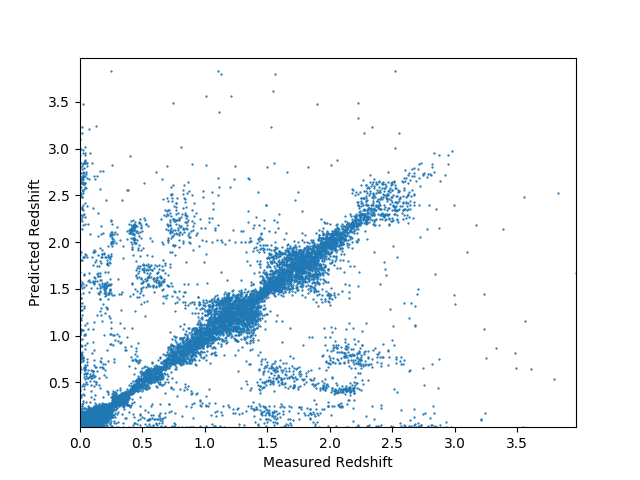

In [190]:
Image(filename='C:\\courses\\coursera\\Past\\ML\\Data Driven Astronomy\\predicted_v_measured.png')

Our sample of galaxies consists of two different populations: regular galaxies and quasi-stellar objects (QSOs). QSOs are a type of galaxy that contain an actively (and intensly) accreting supermassive black hole. This is often referred to as an Active Galactic Nucleus (AGN).

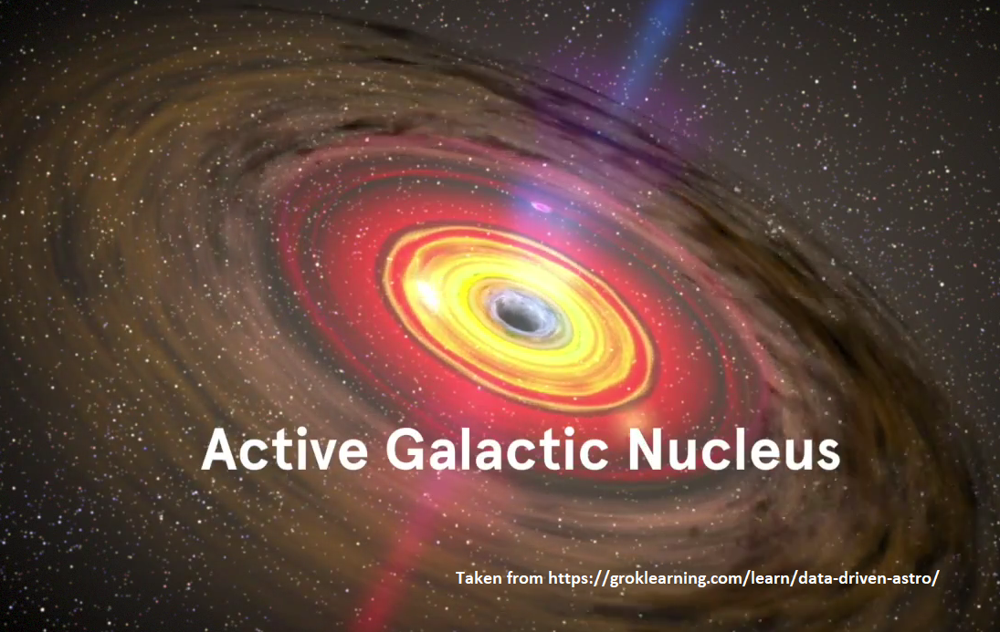

In [184]:
Image(filename='C:\\courses\\coursera\\Past\\ML\\Data Driven Astronomy\\agn.png')

The light emitted from the AGN is significantly brighter than the rest of the galaxy and we are able to detect these QSOs out to much higher redshifts. In fact, most of the normal galaxies we have been using to create our models have redshifts less than *z~0.4*, while the QSOs have redshifts all the way out to *z~6*. Due to this contribution from the AGN, the flux magnitudes measured at different wavelengths might not follow the typical profile we assumed when predicting redshifts.

Next we are going look at whether there is a difference in the accuracy of the decision trees between QSOs and regular galaxies.

## 4. Exploring machine learning classification to predict galaxy classes

There is a wide range of galaxy types observed by the *Sloan Digital Sky Survey* in the *Galaxy Zoo*. In this activity, we will limit our dataset to three types of galaxy: *spirals, ellipticals and mergers*, as shown below. 

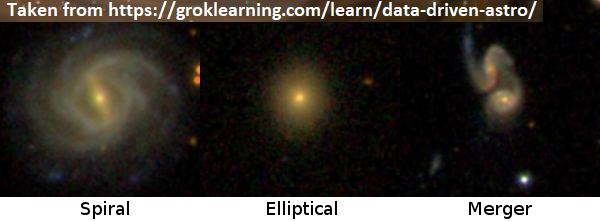

In [192]:
Image(filename='C:\\courses\\coursera\\Past\\ML\\Data Driven Astronomy\\Classes.png')

The galaxy catalogue we are using is a sample of galaxies where at least 20 human classifiers (such as yourself) have come to a consensus on the galaxy type. Examples of spiral and elliptical galaxies were selected where there was a unanimous classification. Due to low sample numbers, we included merger examples where at least 80% of human classifiers selected the merger class. We need this high quality data to train our classifier.

The features that we will be using to do our galaxy classification are colour index, adaptive moments, eccentricities and concentrations. These features are provided as part of the SDSS catalogue.

Colour indices are the same colours (u-g, g-r, r-i, and i-z) we used for regression. Studies of galaxy evolution tell us that spiral galaxies have younger star populations and therefore are 'bluer' (brighter at lower wavelengths). Elliptical galaxies have an older star population and are brighter at higher wavelengths ('redder').

Eccentricity approximates the shape of the galaxy by fitting an ellipse to its profile. Eccentricity is the ratio of the two axis (semi-major and semi-minor). The De Vaucouleurs model was used to attain these two axis. To simplify our experiments, we will use the median eccentricity across the 5 filters.

Adaptive moments also describe the shape of a galaxy. They are used in image analysis to detect similar objects at different sizes and orientations. We use the fourth moment here for each band.

Concentration is similar to the luminosity profile of the galaxy, which measures what proportion of a galaxy's total light is emitted within what radius. A simplified way to represent this is to take the ratio of the radii containing 50% and 90% of the Petrosian flux.

The Petrosian method allows us to compare the radial profiles of galaxies at different distances. If you are interested, you can read more here on the need for Petrosian approach. We will use the concentration from the u, r and z bands. For these experiments, we will define concentration as:

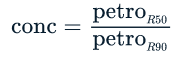

In [198]:
Image(filename='C:\\courses\\coursera\\Past\\ML\\Data Driven Astronomy\\f14.png', width=150, height=25)

We have extracted the SDSS and Galaxy Zoo data for 780 galaxies, the first few rows fo the datatset are shown below:

In [199]:
df = pd.read_csv('C:\\courses\\coursera\\Past\\ML\\Data Driven Astronomy\\sdss_galaxy_catalog.csv')
df.head()

,u-g,g-r,r-i,i-z,ecc,m4_u,m4_g,m4_r,m4_i,m4_z,petroR50_u,petroR50_r,petroR50_z,petroR90_u,petroR90_r,petroR90_z,class
0,1.85765,0.67158,0.42310,0.30610,0.585428,2.251946,2.339849,2.380652,2.359738,2.395528,3.095123,3.818919,3.826230,5.174814,8.263009,11.477340,merger
1,1.74259,0.86085,0.44927,0.28851,0.749812,2.031566,2.084156,2.092272,2.124075,2.133154,1.430436,1.422533,1.385727,3.732712,3.416921,3.330347,merger
2,2.10697,0.96710,0.56810,0.33747,0.630089,1.992887,2.450746,2.473116,2.465324,2.438683,3.099957,3.623704,3.463300,9.110857,8.354343,11.265390,merger
3,1.22840,0.60446,0.39049,0.28913,0.668999,2.056115,2.182252,2.309510,2.391414,2.472397,3.627267,4.063471,3.717708,9.580675,12.202420,11.826220,merger
4,1.80792,0.78124,0.45528,0.35067,0.500170,2.259167,2.194723,2.264567,2.334713,2.352568,3.256751,3.153533,2.254511,9.206746,9.790146,6.636931,merger


As described earlier, the data has the following fields:

* colours: u-g, g-r, r-i, and i-z;
* eccentricity: ecc
* 4th adaptive moments: m4_u, m4_g, m4_r, m4_i, and m4_z;
* 50% Petrosian: petroR50_u, petroR50_r, petroR50_z;
* 90% Petrosian: petroR90_u, petroR90_r, petroR90_z.

Now, let's split the data and generate the features, and then train a **decision tree classifier**, perform a *held-out validation* by predicting the actual classes for later comparison. 

The *accuracy of classification* problems is a lot simpler to calculate than for regression problems. The simplest measure is the fraction of objects that are correctly classified, as shown below. The *accuracy measure* is often called the model score. While the way of calculating the score can vary depending on the model, the accuracy is the most common for classification problems.

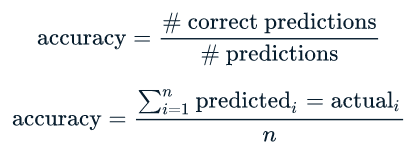

In [205]:
Image(filename='C:\\courses\\coursera\\Past\\ML\\Data Driven Astronomy\\f15.png', width=400, height=50)

In [206]:
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import cross_val_predict
from sklearn.tree import DecisionTreeClassifier
from support_functions import plot_confusion_matrix, generate_features_targets


# Implement the following function
def calculate_accuracy(predicted, actual):
  return sum(predicted == actual) / float(len(actual))

# split the data
features, targets = generate_features_targets(df)

# train the model to get predicted and actual classes
dtc = DecisionTreeClassifier()
predicted = cross_val_predict(dtc, features, targets, cv=10)

# calculate the model score using your function
model_score = calculate_accuracy(predicted, targets)
print("Our accuracy score:", model_score)

# calculate the models confusion matrix using sklearns confusion_matrix function
class_labels = list(set(targets))
model_cm = confusion_matrix(y_true=targets, y_pred=predicted, labels=class_labels)

# Plot the confusion matrix using the provided functions.
plt.figure()
plot_confusion_matrix(model_cm, classes=class_labels, normalize=False)
plt.show()

ImportError: No module named model_selection

In addition to an overall accuracy score, we'd also like to know where our model is going wrong. For example, were the incorrectly classified mergers mis-classified as spirals or ellipticals? To answer this type of question we use a confusion matrix. The confusion matrix computed for our problem is shown below:

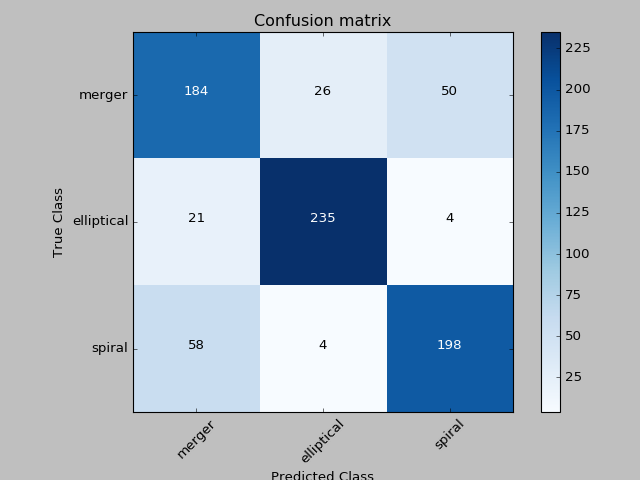

In [208]:
Image(filename='C:\\courses\\coursera\\Past\\ML\\Data Driven Astronomy\\confusion.png')

### Random Forest

So far we have used a single decision tree model. However, we can improve the accuracy of our classification by using a collection (or ensemble) of trees as known as a random forest.

A *random forest* is a collection of decision trees that have each been independently trained using different subsets of the training data and/or different combinations of features in those subsets.

When making a prediction, every tree in the forest gives its own prediction and the most common classification is taken as the overall forest prediction (in regression the mean prediction is used).

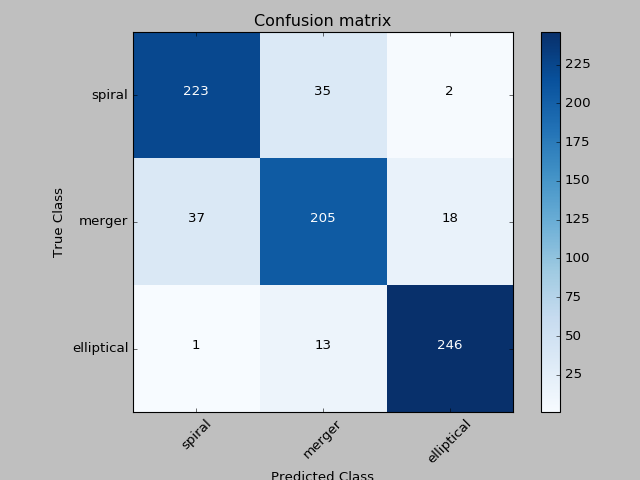

In [209]:
Image(filename='C:\\courses\\coursera\\Past\\ML\\Data Driven Astronomy\\confusion2.png')